## Music emotion recognition

In [40]:
import pandas as pd 
import numpy as np
import librosa
import seaborn as sns
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import plotly.express as px
import IPython.display as ipd
import math, random
import torch
import torchaudio
from torchaudio import transforms
from IPython.display import Audio
from tensorflow.keras import models, layers
import matplotlib.patches as patches
from tensorflow.keras.preprocessing.sequence import pad_sequences

#Ignore warning
import warnings
warnings.filterwarnings("ignore")

**Methods**

In [2]:
def featureAnalysis(feature,dataset):
    a = dataset.describe()
    b = a[feature].to_frame().T
    fig, ax = plt.subplots(2, 1, figsize=(20, 18))
    sns.histplot(x=dataset[feature], data=dataset, kde=True, element="step",ax=ax[0])
    sns.boxplot(data=dataset , x = feature ,ax=ax[1])
    return(b)

In [3]:
def play_audio(track):
    return ipd.Audio("Datasets/DEAM/MEMD_audio/"+track+'.mp3')

In [4]:
def get_waves(song_id):
    audio_path = "Datasets/DEAM/MEMD_audio/"+str(song_id)+".mp3"
    x , sr = librosa.load(audio_path)
    return x

**Loading Dataset**

In [5]:
annot = pd.read_csv("Datasets/DEAM/DEAM_Annotations/annot.csv")
annot

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
0,2,3.10,0.94,3.00,0.63
1,3,3.50,1.75,3.30,1.62
2,4,5.70,1.42,5.50,1.63
3,5,4.40,2.01,5.30,1.85
4,7,5.80,1.47,6.40,1.69
...,...,...,...,...,...
1797,2054,5.40,1.20,3.60,1.36
1798,2055,5.00,1.41,5.20,1.47
1799,2056,5.00,1.41,4.60,1.74
1800,2057,3.17,1.07,6.83,0.37


In [6]:
annot['song_id'].nunique()

1802

In [7]:
fig = px.scatter(annot, x=' arousal_mean', y=' valence_mean', text='song_id', title='Scatter Plot with Hover Information')
fig.update_layout(
    hoverlabel=dict(bgcolor="white", font_size=16, font_family="Arial"),
    hovermode='closest')
fig.show()

In [8]:
#Low valence and low arousal
play_audio('1182')

In [9]:
#High valence and Low arousal
play_audio('253')

In [10]:
#Low valence and High arousal
play_audio('1334')

In [11]:
#high valence and High arousal
play_audio('115')

###  **Define Labels**
Considering the features extracted from our dataset, we possess the mean and standard deviation values for both arousal and valence associated with each song. It would be prudent to establish distinct ranges for each song based on these metrics, allowing us to assign labels to specific regions within the valence and arousal ranges.

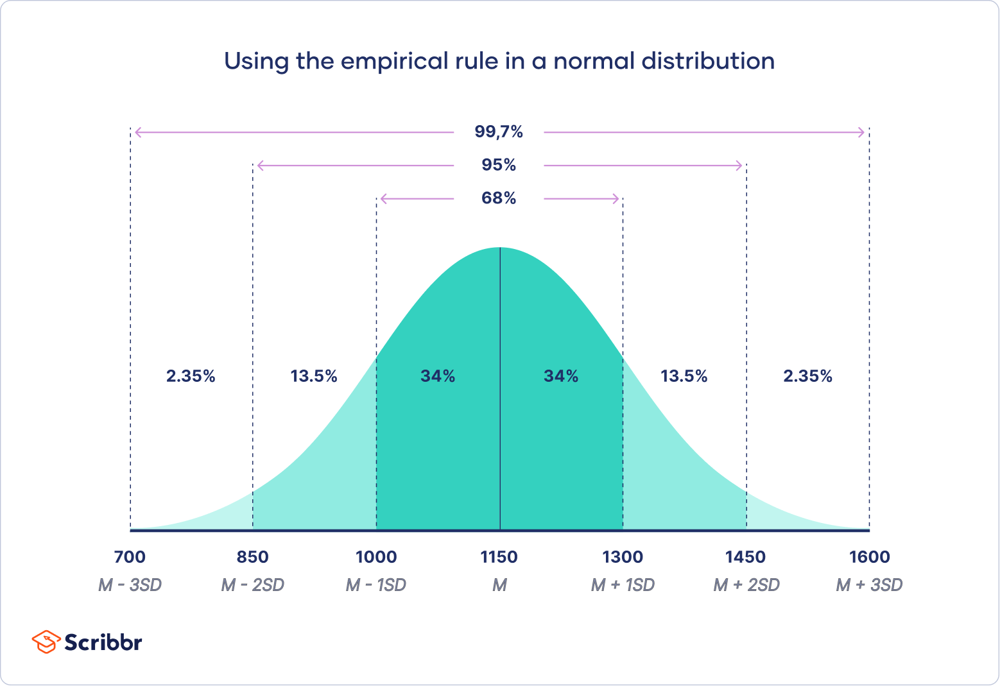

In [12]:
#One std (68)
#Range Arousal 
annot['min_arousal_68'] = annot[' arousal_mean'] - annot[' arousal_std']
annot['max_arousal_68'] = annot[' arousal_mean'] + annot[' arousal_std']
#Range valence
annot['min_valence_68'] = annot[' valence_mean'] - annot[' valence_std']
annot['max_valence_68'] = annot[' valence_mean'] + annot[' valence_std']

#Two std (95)
#Range Arousal 
annot['min_arousal_95'] = annot[' arousal_mean'] - 2*annot[' arousal_std']
annot['max_arousal_95'] = annot[' arousal_mean'] + 2*annot[' arousal_std']
#Range valence
annot['min_valence_95'] = annot[' valence_mean'] - 2*annot[' valence_std']
annot['max_valence_95'] = annot[' valence_mean'] + 2*annot[' valence_std']

#Three std (99.7)
#Range Arousal 
annot['min_arousal_99'] = annot[' arousal_mean'] - 3*annot[' arousal_std']
annot['max_arousal_99'] = annot[' arousal_mean'] + 3*annot[' arousal_std']
#Range valence
annot['min_valence_99'] = annot[' valence_mean'] - 3*annot[' valence_std']
annot['max_valence_99'] = annot[' valence_mean'] + 3*annot[' valence_std']

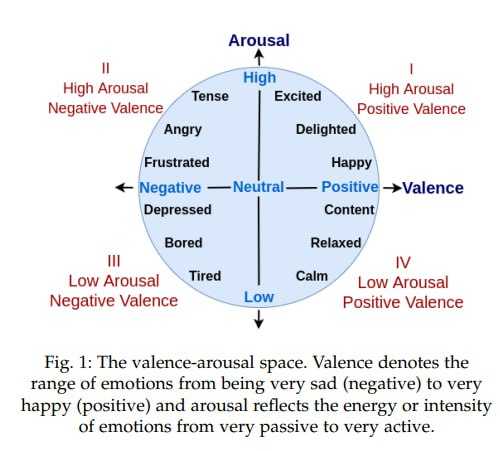

**To assign labels to the areas defined by the arousal and valence ranges, we adopt a dual perspective approach.**

- First point of view

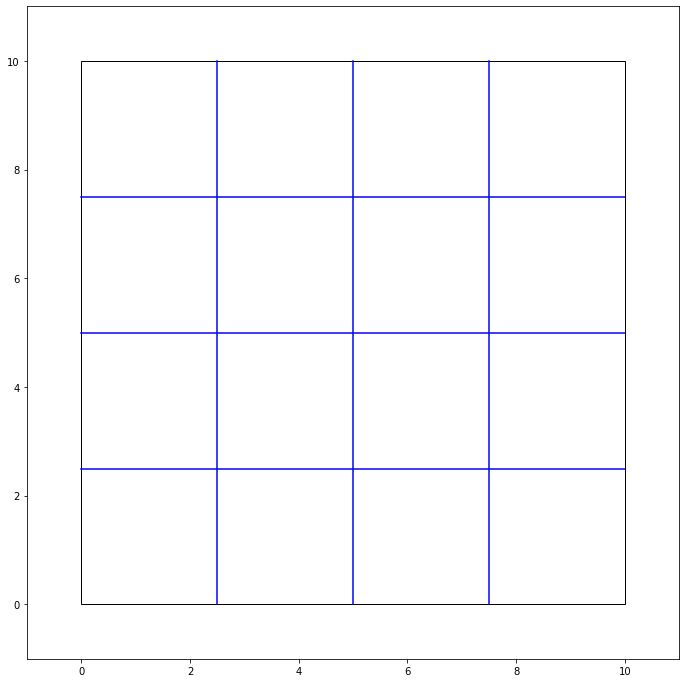

In [13]:
plt.figure(figsize=(15, 12))

square = plt.Rectangle((0, 0), 10, 10, fill=None, edgecolor='black')
plt.gca().add_patch(square)

# Define the lines
line1 = plt.Line2D([2.5, 2.5], [0, 10], color='blue')  # Vertical line x=2.5
line0 = plt.Line2D([5, 5], [0, 10], color='blue')  # Vertical line x=2.5

line2 = plt.Line2D([7.5, 7.5], [0, 10], color='blue')  # Vertical line x=7.5
line3 = plt.Line2D([0, 10], [2.5, 2.5], color='blue')  # Horizontal line y=2.5
line4 = plt.Line2D([0, 10], [5, 5], color='blue')  # Horizontal line y=5
line5 = plt.Line2D([0, 10], [7.5, 7.5], color='blue')  # Horizontal line y=7.5

# Add the lines to the plot
plt.gca().add_line(line1)
plt.gca().add_line(line0)
plt.gca().add_line(line2)
plt.gca().add_line(line3)
plt.gca().add_line(line4)
plt.gca().add_line(line5)

# Set plot limits
plt.xlim(-1, 11)
plt.ylim(-1, 11)

# Set aspect ratio to be equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()


In [14]:
def calculate_emotional_state_vector(x1, x2, y1, y2):
    total_area = (x2 - x1) * (y2 - y1)

    # Define emotional state regions
    neutral_region = (max(2.5, x1), min(7.5, x2), max(2.5, y1), min(7.5, y2))
    excited_region = (max(5, x1), min(7.5, x2), max(7.5, y1), min(7.5, y2))
    delighted_region = (max(7.5, x1), x2, max(7.5, y1), min(7.5, y2))
    happy_region = (max(7.5, x1), x2, max(5, y1), min(7.5, y2))
    content_region = (max(7.5, x1), x2, max(2.5, y1), min(5, y2))
    relaxed_region = (max(7.5, x1), x2, y1, min(2.5, y2))
    calm_region = (max(5, x1), min(7.5, x2), y1, min(2.5, y2))
    tired_region = (max(2.5, x1), min(5, x2), y1, min(2.5, y2))
    bored_region = (x1, min(2.5, x2), y1, min(2.5, y2))
    depressed_region = (x1, min(2.5, x2), max(2.5, y1), min(5, y2))
    frustrated_region = (x1, min(2.5, x2), max(5, y1), min(7.5, y2))
    angry_region = (x1, min(2.5, x2), max(7.5, y1), y2)
    tense_region = (max(2.5, x1), min(5, x2), max(7.5, y1), y2)

    # Calculate the area of intersection for each emotional state
    neutral_area = max(0, neutral_region[1] - neutral_region[0]) * max(0, neutral_region[3] - neutral_region[2])
    excited_area = max(0, excited_region[1] - excited_region[0]) * max(0, excited_region[3] - excited_region[2])
    delighted_area = max(0, delighted_region[1] - delighted_region[0]) * max(0, delighted_region[3] - delighted_region[2])
    happy_area = max(0, happy_region[1] - happy_region[0]) * max(0, happy_region[3] - happy_region[2])
    content_area = max(0, content_region[1] - content_region[0]) * max(0, content_region[3] - content_region[2])
    relaxed_area = max(0, relaxed_region[1] - relaxed_region[0]) * max(0, relaxed_region[3] - relaxed_region[2])
    calm_area = max(0, calm_region[1] - calm_region[0]) * max(0, calm_region[3] - calm_region[2])
    tired_area = max(0, tired_region[1] - tired_region[0]) * max(0, tired_region[3] - tired_region[2])
    bored_area = max(0, bored_region[1] - bored_region[0]) * max(0, bored_region[3] - bored_region[2])
    depressed_area = max(0, depressed_region[1] - depressed_region[0]) * max(0, depressed_region[3] - depressed_region[2])
    frustrated_area = max(0, frustrated_region[1] - frustrated_region[0]) * max(0, frustrated_region[3] - frustrated_region[2])
    angry_area = max(0, angry_region[1] - angry_region[0]) * max(0, angry_region[3] - angry_region[2])
    tense_area = max(0, tense_region[1] - tense_region[0]) * max(0, tense_region[3] - tense_region[2])

    # Calculate the percentage of the total area for each emotional state
    neutral_percentage = (neutral_area / total_area) * 100
    excited_percentage = (excited_area / total_area) * 100
    delighted_percentage = (delighted_area / total_area) * 100
    happy_percentage = (happy_area / total_area) * 100
    content_percentage = (content_area / total_area) * 100
    relaxed_percentage = (relaxed_area / total_area) * 100
    calm_percentage = (calm_area / total_area) * 100
    tired_percentage = (tired_area / total_area) * 100
    bored_percentage = (bored_area / total_area) * 100
    depressed_percentage = (depressed_area / total_area) * 100
    frustrated_percentage = (frustrated_area / total_area) * 100
    angry_percentage = (angry_area / total_area) * 100
    tense_percentage = (tense_area / total_area) * 100

    return [neutral_percentage, excited_percentage, delighted_percentage, happy_percentage, content_percentage,
            relaxed_percentage, calm_percentage, tired_percentage, bored_percentage, depressed_percentage,
            frustrated_percentage, angry_percentage, tense_percentage]


In [15]:
df_labeled_v1_68 = annot[['song_id','min_arousal_68', 'max_arousal_68', 'min_valence_68','max_valence_68']]
df_labeled_v1_95 = annot[['song_id','min_arousal_95', 'max_arousal_95', 'min_valence_95','max_valence_95']]
df_labeled_v1_99 = annot[['song_id','min_arousal_99', 'max_arousal_99', 'min_valence_99','max_valence_99']]

In [16]:
#68
df_labeled_v1_68['emotional_vector'] = df_labeled_v1_68.apply(lambda row: calculate_emotional_state_vector(row['min_valence_68'], row['max_valence_68'], row['min_arousal_68'], row['max_arousal_68']), axis=1)
df_labeled_v1_68[['neutral_percentage', 'excited_percentage', 'delighted_percentage', 'happy_percentage', 'content_percentage',
    'relaxed_percentage', 'calm_percentage', 'tired_percentage', 'bored_percentage', 'depressed_percentage',
    'frustrated_percentage', 'angry_percentage', 'tense_percentage']] = pd.DataFrame(df_labeled_v1_68['emotional_vector'].tolist(), index=df_labeled_v1_68.index)

df_labeled_v1_68 = df_labeled_v1_68.drop('emotional_vector', axis=1)
#95
df_labeled_v1_95['emotional_vector'] = df_labeled_v1_95.apply(lambda row: calculate_emotional_state_vector(row['min_valence_95'], row['max_valence_95'], row['min_arousal_95'], row['max_arousal_95']), axis=1)
df_labeled_v1_95[['neutral_percentage', 'excited_percentage', 'delighted_percentage', 'happy_percentage', 'content_percentage',
    'relaxed_percentage', 'calm_percentage', 'tired_percentage', 'bored_percentage', 'depressed_percentage',
    'frustrated_percentage', 'angry_percentage', 'tense_percentage']] = pd.DataFrame(df_labeled_v1_95['emotional_vector'].tolist(), index=df_labeled_v1_95.index)
df_labeled_v1_95 = df_labeled_v1_95.drop('emotional_vector', axis=1)

#99
df_labeled_v1_99['emotional_vector'] = df_labeled_v1_99.apply(lambda row: calculate_emotional_state_vector(row['min_valence_99'], row['max_valence_99'], row['min_arousal_99'], row['max_arousal_99']), axis=1)
df_labeled_v1_99[['neutral_percentage', 'excited_percentage', 'delighted_percentage', 'happy_percentage', 'content_percentage',
    'relaxed_percentage', 'calm_percentage', 'tired_percentage', 'bored_percentage', 'depressed_percentage',
    'frustrated_percentage', 'angry_percentage', 'tense_percentage']] = pd.DataFrame(df_labeled_v1_99['emotional_vector'].tolist(), index=df_labeled_v1_95.index)
df_labeled_v1_99 = df_labeled_v1_99.drop('emotional_vector', axis=1)

- Second point of view

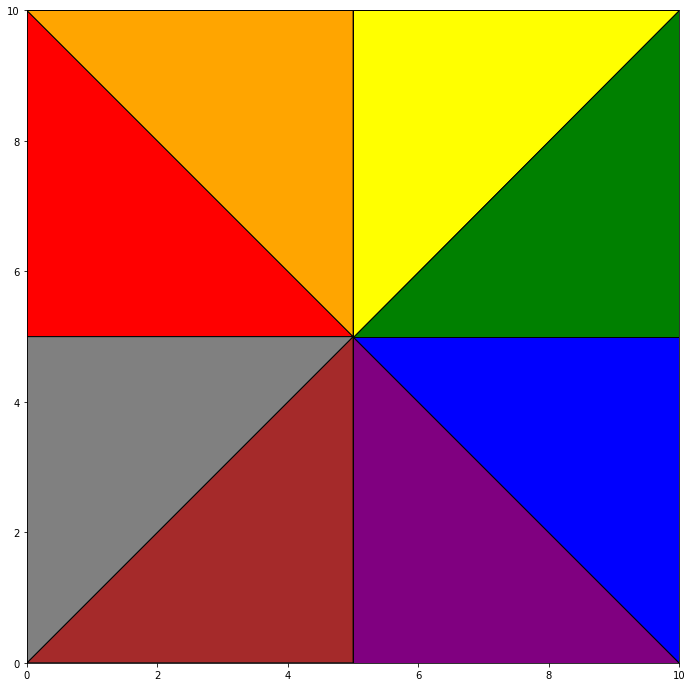

In [17]:
frustrated = [(5,5), (0, 10), (0, 5)]
tense = [(5,5), (0, 10), (5, 10)]
excited = [(5,5), (5, 10), (10, 10)]
happy = [(5,5), (10, 5), (10, 10)]
content = [(5,5), (10, 5), (10, 0)]
calm = [(5,5), (5, 0), (10, 0)]
tired = [(5,5), (0, 0), (5, 0)]
depressed = [(5,5), (0, 0), (0, 5)]

# Create a 10x10 square
fig, ax = plt.subplots(figsize=(15, 12))
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)

# Plot each triangle and assign a color
triangle_list = [frustrated, tense, excited, happy, content, calm, tired, depressed]
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'brown', 'gray']

for i, triangle in enumerate(triangle_list):
    polygon = patches.Polygon(triangle, closed=True, edgecolor='black', facecolor=colors[i])
    ax.add_patch(polygon)

# Display the plot
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [18]:
triangles = {
    "frustrated": [(5, 5), (0, 10), (0, 5)],
    "tense": [(5, 5), (0, 10), (5, 10)],
    "excited": [(5, 5), (5, 10), (10, 10)],
    "happy": [(5, 5), (10, 5), (10, 10)],
    "content": [(5, 5), (10, 5), (10, 0)],
    "calm": [(5, 5), (5, 0), (10, 0)],
    "tired": [(5, 5), (0, 0), (5, 0)],
    "depressed": [(5, 5), (0, 0), (0, 5)],
}

def give_me_cordinates(x1,x2,y1,y2):
    rectangle_coords = (x1, x2, y1, y2)
    rectangle = Polygon([(rectangle_coords[0], rectangle_coords[2]),
                     (rectangle_coords[0], rectangle_coords[3]),
                     (rectangle_coords[1], rectangle_coords[3]),
                     (rectangle_coords[1], rectangle_coords[2])])
    area_rectangle =  rectangle.area
    dict_class = {}
    for triangle_name, triangle_coords in triangles.items():
        triangle = Polygon(triangle_coords)
        intersection = rectangle.intersection(triangle)
        intersection_area = intersection.area
        dict_class[triangle_name] = (intersection_area / area_rectangle)*100
    return dict_class
    

In [19]:
df_labeled_v2_68 = annot[['song_id','min_arousal_68', 'max_arousal_68', 'min_valence_68','max_valence_68']]
df_labeled_v2_95 = annot[['song_id','min_arousal_95', 'max_arousal_95', 'min_valence_95','max_valence_95']]
df_labeled_v2_99 = annot[['song_id','min_arousal_99', 'max_arousal_99', 'min_valence_99','max_valence_99']]

In [20]:
#68
result = df_labeled_v2_68.apply(lambda row: give_me_cordinates(row['min_valence_68'], row['max_valence_68'], row['min_arousal_68'], row['max_arousal_68']), axis=1)
for key in triangles.keys():
    df_labeled_v2_68[key] = result.apply(lambda x: x[key])
    
#95
result = df_labeled_v2_95.apply(lambda row: give_me_cordinates(row['min_valence_95'], row['max_valence_95'], row['min_arousal_95'], row['max_arousal_95']), axis=1)
for key in triangles.keys():
    df_labeled_v2_95[key] = result.apply(lambda x: x[key])
    
    
#99
result = df_labeled_v2_99.apply(lambda row: give_me_cordinates(row['min_valence_99'], row['max_valence_99'], row['min_arousal_99'], row['max_arousal_99']), axis=1)
for key in triangles.keys():
    df_labeled_v2_99[key] = result.apply(lambda x: x[key])

In [21]:
df_labeled_v2_68

,song_id,min_arousal_68,max_arousal_68,min_valence_68,max_valence_68,frustrated,tense,excited,happy,content,calm,tired,depressed
0,2,2.37,3.63,2.16,4.04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55.319149,44.680851
1,3,1.68,4.92,1.75,5.25,0.000000,0.000000,0.000000,0.000000,0.127425,7.015432,48.549824,44.307319
2,4,3.87,7.13,4.28,7.12,2.799620,13.764797,24.500994,24.272012,18.978981,6.895900,5.988076,2.799620
3,5,3.45,7.15,2.39,6.41,22.188046,15.538860,13.698064,6.683138,6.683138,8.010286,8.076173,19.122294
4,7,4.71,8.09,4.33,7.27,2.258685,18.575152,44.658958,25.927324,6.201445,0.423157,0.423157,1.532122
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,2054,2.24,4.96,4.20,6.60,0.000000,0.000000,0.000000,0.000000,18.639706,48.026961,28.909314,4.424020
1798,2055,3.73,6.67,3.59,6.41,11.989796,16.411565,16.411565,11.989796,11.871593,9.727047,9.727047,11.871593
1799,2056,2.86,6.34,3.59,6.41,10.104345,9.148529,9.148529,10.104345,10.129310,20.617816,20.617816,10.129310
1800,2057,6.46,7.20,2.10,4.24,50.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [22]:
df_labeled_v2_68.columns

Index(['song_id', 'min_arousal_68', 'max_arousal_68', 'min_valence_68',
       'max_valence_68', 'frustrated', 'tense', 'excited', 'happy', 'content',
       'calm', 'tired', 'depressed'],
      dtype='object')

In [23]:
lebel_class =['frustrated', 'tense', 'excited', 'happy', 'content',
       'calm', 'tired', 'depressed']

In [24]:
df_labeled_v2_68[lebel_class] 

,frustrated,tense,excited,happy,content,calm,tired,depressed
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55.319149,44.680851
1,0.000000,0.000000,0.000000,0.000000,0.127425,7.015432,48.549824,44.307319
2,2.799620,13.764797,24.500994,24.272012,18.978981,6.895900,5.988076,2.799620
3,22.188046,15.538860,13.698064,6.683138,6.683138,8.010286,8.076173,19.122294
4,2.258685,18.575152,44.658958,25.927324,6.201445,0.423157,0.423157,1.532122
...,...,...,...,...,...,...,...,...
1797,0.000000,0.000000,0.000000,0.000000,18.639706,48.026961,28.909314,4.424020
1798,11.989796,16.411565,16.411565,11.989796,11.871593,9.727047,9.727047,11.871593
1799,10.104345,9.148529,9.148529,10.104345,10.129310,20.617816,20.617816,10.129310
1800,50.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


**First Categorical Idea**

In [25]:
threshold = 13
df_binary_v2_68 = df_labeled_v2_68[lebel_class] .applymap(lambda x: 1 if x > threshold else 0)
df_binary_v2_68['song_id'] = df_labeled_v2_68['song_id'] 
df_binary_v2_68

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id
0,0,0,0,0,0,0,1,1,2
1,0,0,0,0,0,0,1,1,3
2,0,1,1,1,1,0,0,0,4
3,1,1,1,0,0,0,0,1,5
4,0,1,1,1,0,0,0,0,7
...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054
1798,0,1,1,0,0,0,0,0,2055
1799,0,0,0,0,0,1,1,0,2056
1800,1,1,0,0,0,0,0,0,2057


In [26]:
df_binary_v2_68.loc[20]['song_id']

37

## Feature extraction

In [27]:
def mp3_to_mel_spectrogram(file_path, n_fft=2048, hop_length=512, n_mels=128):
    y, sr = librosa.load(file_path)
    mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
    return mel_spectrogram_db

def plot_mel_spectrogram(mel_spectrogram, sr, hop_length):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mel_spectrogram, x_axis='time', y_axis='mel', sr=sr, hop_length=hop_length)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.show()


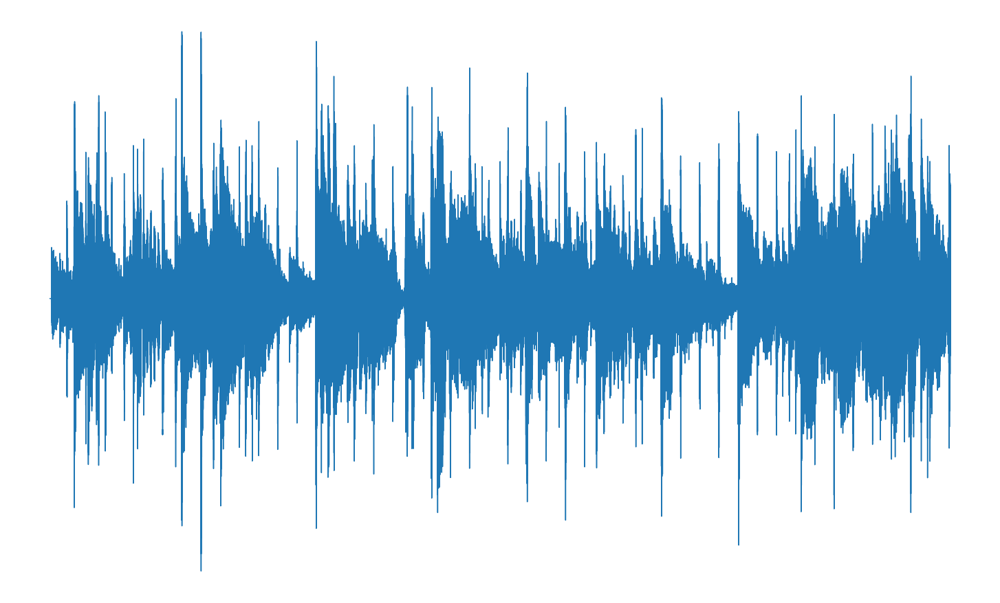

In [32]:
plt.figure(figsize=(20, 12))
file_path = "Datasets/DEAM/MEMD_audio/10.mp3"
y, sr = librosa.load(file_path)
plt.plot(y);
# plt.title('Signal');
plt.xlabel('Time (samples)');
plt.ylabel('Amplitude');
plt.axis('off')  
plt.tight_layout(pad=0) 
plt.tight_layout(pad=0)  
plt.savefig("output_spectrogram.png", bbox_inches='tight', pad_inches=0, transparent=True) 

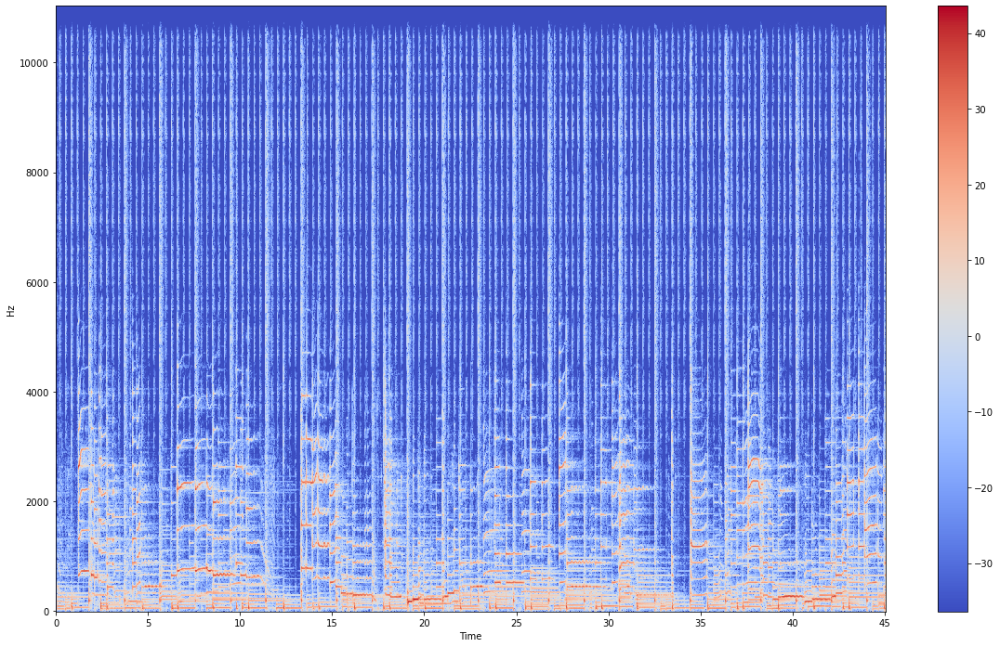

In [29]:
x, sr = librosa.load(file_path)
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(20, 12))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

In [34]:
file_path

'Datasets/DEAM/MEMD_audio/10.mp3'

In [35]:
def resize_image(X):
    image=Image.open(X)
    image=image.resize((300,300))
    #image = image.convert("L")
    image.save(X)

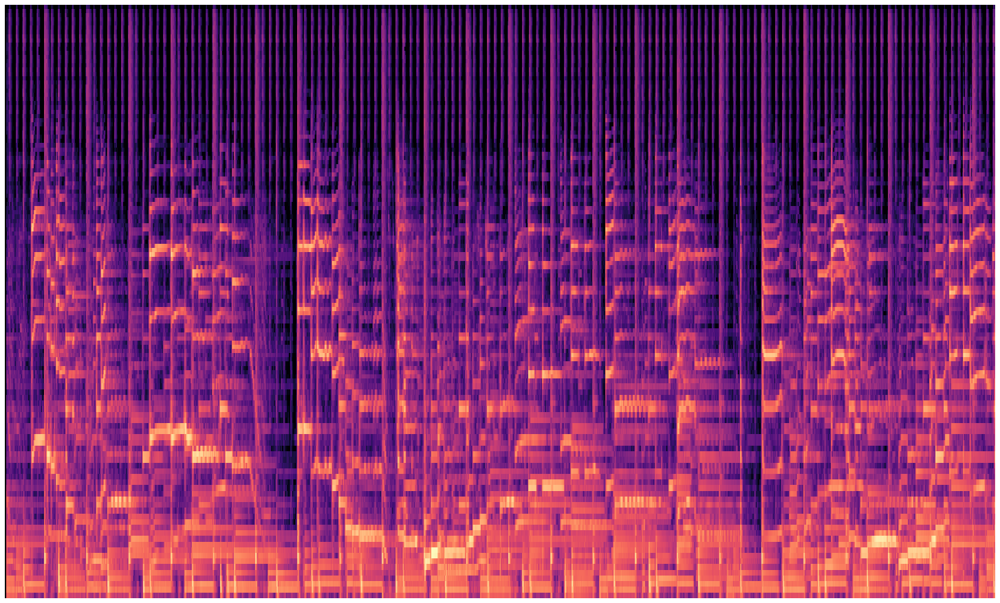

In [73]:
x, sr = librosa.load(file_path)
S = librosa.feature.melspectrogram(y=x, sr=sr)
S_db = librosa.power_to_db(S, ref=np.max)
plt.figure(figsize=(20, 12))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel')
plt.axis('off')  
plt.tight_layout(pad=0)  
plt.savefig("output_spectrogram.png", bbox_inches='tight', pad_inches=0, transparent=True) 

In [72]:
img_array = imageio.imread("output_spectrogram.png")
img_array.shape

(864, 1440, 4)

In [53]:
def plot_spectrogram(spectrogram, out_path=None):
    ax = librosa.display.specshow(spectrogram)
    
    if out_path is None:
        ax.plot()
    else:
        plt.axis('off')
        plt.savefig(out_path, dpi=100, frameon=False, aspect='normal', bbox_inches='tight', pad_inches=0)
        plt.close('all')

In [35]:
def make_spectogram(song):
    file_path = "Datasets/DEAM/MEMD_audio/"+song+'.mp3'
    x, sr = librosa.load(file_path)
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    return Xdb

In [85]:
import os


In [ ]:
def make_spectrogram(song, output_dir="output_spectrograms"):
    file_path = os.path.join("Datasets/DEAM/MEMD_audio", f"{song}.mp3")
    x, sr = librosa.load(file_path, sr=44000)
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(np.abs(X))
    if Xdb.shape[1] > 2000:
        Xdb = Xdb[:, :2000]
    else:
        pad_width = 2000 - Xdb.shape[1]
        Xdb = np.pad(Xdb, ((0, 0), (0, pad_width)), mode='constant', constant_values=0)
    
    x, sr = librosa.load(file_path)
    S = librosa.feature.melspectrogram(y=x, sr=sr)
    S_db = librosa.power_to_db(S, ref=np.max)
    
    plt.figure(figsize=(20, 12))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel')
    plt.axis('off')  
    plt.tight_layout(pad=0)  
    
    output_path = os.path.join(output_dir, f"{song}_spectrogram.png")
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True) 
    
    image = cv2.imread(output_path)  
    new_size = (432, 720)
    resized_image = cv2.resize(image, new_size)
    
    print(resized_image.shape)
    
    return output_path  

song_ids = df_binary_v2_68['song_id'].tolist()

df = pd.DataFrame(columns=["Song_ID", "Image_Path"])

os.makedirs("output_spectrograms", exist_ok=True)

for song_id in song_ids:
    image_path = make_spectrogram(song_id)
    df = df.append({"Song_ID": song_id, "Image_Path": image_path}, ignore_index=True)


(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)
(720, 432, 3)


In [82]:
def make_spectrogram(song):
    file_path = "Datasets/DEAM/MEMD_audio/" + song + '.mp3'
    x, sr = librosa.load(file_path, sr=44000) 
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(np.abs(X))
    if Xdb.shape[1] > 2000:
        Xdb = Xdb[:, :2000]
    else:
        pad_width = 2000 - Xdb.shape[1]
        Xdb = np.pad(Xdb, ((0, 0), (0, pad_width)), mode='constant', constant_values=0)
    x, sr = librosa.load(file_path)
    S = librosa.feature.melspectrogram(y=x, sr=sr)
    S_db = librosa.power_to_db(S, ref=np.max)
    plt.figure(figsize=(20, 12))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel')
    plt.axis('off')  
    plt.tight_layout(pad=0)  
    plt.savefig("output_spectrogram.png", bbox_inches='tight', pad_inches=0, transparent=True) 
    image = cv2.imread("output_spectrogram.png")  
    new_size = (432, 720)
    resized_image = cv2.resize(image, new_size)
    print(resized_image.shape)
    return Xdb


(720, 432, 3)


array([[-33.621746  , -33.621746  , -33.621746  , ...,   0.06863962,
          7.7703676 ,   7.95428   ],
       [-33.621746  , -33.621746  , -33.621746  , ...,  15.878742  ,
         16.938065  ,  17.684011  ],
       [-33.621746  , -33.621746  , -33.621746  , ...,  27.823307  ,
         29.22028   ,  29.058125  ],
       ...,
       [-33.621746  , -33.621746  , -33.621746  , ..., -33.621746  ,
        -33.621746  , -33.621746  ],
       [-33.621746  , -33.621746  , -33.621746  , ..., -33.621746  ,
        -33.621746  , -33.621746  ],
       [-33.621746  , -33.621746  , -33.621746  , ..., -33.621746  ,
        -33.621746  , -33.621746  ]], dtype=float32)

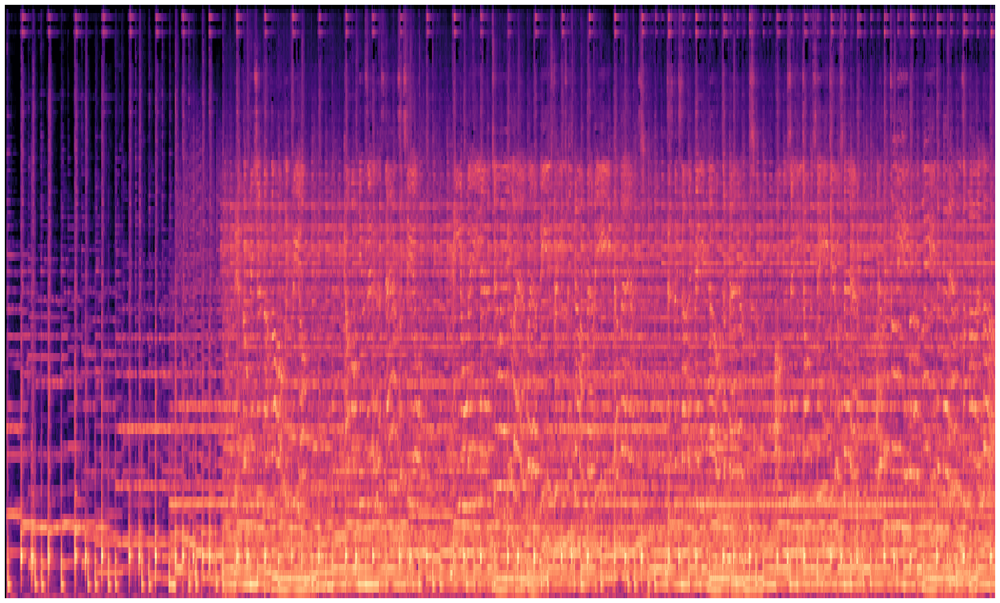

In [83]:
 make_spectrogram(str(22))

In [37]:
dict_spect = {}
for song in df_binary_v2_68['song_id'].tolist():
    dict_spect[song] = make_spectrogram(str(song))

In [38]:
dict_spect[2].shape

(1025, 2000)

In [39]:
dict_spect[22].shape

(1025, 2000)

In [35]:
df_binary_v2_68

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id
0,0,0,0,0,0,0,1,1,2
1,0,0,0,0,0,0,1,1,3
2,0,1,1,1,1,0,0,0,4
3,1,1,1,0,0,0,0,1,5
4,0,1,1,1,0,0,0,0,7
...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054
1798,0,1,1,0,0,0,0,0,2055
1799,0,0,0,0,0,1,1,0,2056
1800,1,1,0,0,0,0,0,0,2057


In [33]:
def get_waves(song_id):
    audio_path = "Datasets/DEAM/MEMD_audio/"+str(song_id)+".mp3"
    x , sr = librosa.load(audio_path)
    return x

In [36]:
df_binary_v2_68['Wave'] = df_binary_v2_68['song_id'].apply(get_waves)

In [37]:
df_binary_v2_68['len_wave'] = df_binary_v2_68['Wave'].apply(lambda x: len(x))

In [38]:
df_binary_v2_68['len_wave'].min()

984379

In [39]:
df_binary_v2_68

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id,Wave,len_wave
0,0,0,0,0,0,0,1,1,2,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,...",993595
1,0,0,0,0,0,0,1,1,3,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1...",993019
2,0,1,1,1,1,0,0,0,4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019
3,1,1,1,0,0,0,0,1,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019
4,0,1,1,1,0,0,0,0,7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595
...,...,...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6...",2107008
1798,0,1,1,0,0,0,0,0,2055,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0...",6258816
1799,0,0,0,0,0,1,1,0,2056,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5...",3704256
1800,1,1,0,0,0,0,0,0,2057,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,...",4035456


In [41]:
max_len = 993595  
df_binary_v2_68['Padded_Wave'] = list(pad_sequences(df_binary_v2_68['Wave'], maxlen=max_len, truncating='post', padding='post', dtype='float32'))

In [42]:
df_binary_v2_68

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id,Wave,len_wave,Padded_Wave
0,0,0,0,0,0,0,1,1,2,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,...",993595,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,..."
1,0,0,0,0,0,0,1,1,3,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1...",993019,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1..."
2,0,1,1,1,1,0,0,0,4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,1,1,1,0,0,0,0,1,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,0,1,1,1,0,0,0,0,7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6...",2107008,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6..."
1798,0,1,1,0,0,0,0,0,2055,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0...",6258816,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0..."
1799,0,0,0,0,0,1,1,0,2056,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5...",3704256,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5..."
1800,1,1,0,0,0,0,0,0,2057,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,...",4035456,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,..."


In [44]:
df_binary_v2_68['len_pad'] = df_binary_v2_68['Padded_Wave'].apply(lambda x: len(x))

In [45]:
df_binary_v2_68

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id,Wave,len_wave,Padded_Wave,len_pad
0,0,0,0,0,0,0,1,1,2,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,...",993595,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,...",993595
1,0,0,0,0,0,0,1,1,3,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1...",993019,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1...",993595
2,0,1,1,1,1,0,0,0,4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595
3,1,1,1,0,0,0,0,1,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993019,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595
4,0,1,1,1,0,0,0,0,7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",993595
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6...",2107008,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6...",993595
1798,0,1,1,0,0,0,0,0,2055,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0...",6258816,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0...",993595
1799,0,0,0,0,0,1,1,0,2056,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5...",3704256,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5...",993595
1800,1,1,0,0,0,0,0,0,2057,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,...",4035456,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,...",993595


In [46]:
df_binary_v2_68.columns

Index(['frustrated', 'tense', 'excited', 'happy', 'content', 'calm', 'tired',
       'depressed', 'song_id', 'Wave', 'len_wave', 'Padded_Wave', 'len_pad'],
      dtype='object')

In [47]:
good_one = ['frustrated', 'tense', 'excited', 'happy', 'content', 'calm', 'tired',
       'depressed', 'song_id', 'Padded_Wave']
df_binary_v2_68[good_one]

,frustrated,tense,excited,happy,content,calm,tired,depressed,song_id,Padded_Wave
0,0,0,0,0,0,0,1,1,2,"[-2.9273459e-18, 4.3368087e-19, 1.0299921e-18,..."
1,0,0,0,0,0,0,1,1,3,"[-3.3068166e-18, -2.9273459e-18, -2.3310347e-1..."
2,0,1,1,1,1,0,0,0,4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,1,1,1,0,0,0,0,1,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,0,1,1,1,0,0,0,0,7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...
1797,0,0,0,0,1,1,1,0,2054,"[2.7200464e-15, 2.553513e-15, 4.440892e-16, -6..."
1798,0,1,1,0,0,0,0,0,2055,"[5.551115e-17, -7.771561e-16, 4.9960036e-16, 0..."
1799,0,0,0,0,0,1,1,0,2056,"[4.440892e-16, 4.57967e-16, -1.3877788e-17, -5..."
1800,1,1,0,0,0,0,0,0,2057,"[-2.4980018e-16, 1.6653345e-16, -6.938894e-17,..."


In [52]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report

In [51]:
X = np.array(df_binary_v2_68['Padded_Wave'].tolist())
y = df_binary_v2_68.iloc[:, :8].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the data if needed (depends on the model requirements)
X_train = X_train.reshape((X_train.shape[0], -1))
X_test = X_test.reshape((X_test.shape[0], -1))

# Choose and train the model (MLPClassifier in this example)
model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Print classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

NameError: name 'classification_report' is not defined

In [53]:
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.35      0.27      0.30       118
           1       0.24      0.27      0.26        91
           2       0.41      0.50      0.45       131
           3       0.39      0.46      0.42       132
           4       0.23      0.44      0.31        91
           5       0.33      0.48      0.39       122
           6       0.44      0.38      0.41       168
           7       0.52      0.53      0.52       177

   micro avg       0.37      0.42      0.39      1030
   macro avg       0.36      0.41      0.38      1030
weighted avg       0.38      0.42      0.40      1030
 samples avg       0.36      0.42      0.37      1030

